## 2-1. 프로젝트: 새로운 데이터셋으로 나만의 이미지 분류기 만들어보기

### **Step 1. 데이터셋 내려받기**

---

이번에는 `tensorflow_datasets` 에 포함된 `tf_flowers` 데이터를 사용해 보겠습니다. `tf_flowers` 데이터에 대한 정보는 다음에서 확인해볼 수 있습니다.

`tfds.load`를 활용하여 데이터셋을 다운받으세요.

https://www.tensorflow.org/datasets/catalog/tf_flowers

### **Step 2. 데이터셋을 모델에 넣을 수 있는 형태로 준비하기**

---

이미지를 모두 같은 크기로 formatting 한 후, `train_batches`, `validation_batches`, `test_batches`를 준비합니다.

### **Step 3. 모델 설계하기**

---

모델은 어떤 방식으로 설계하고 싶은가요? 나만의 모델을 만들 것인가요, 아니면 `base_model`을 활용할 것인가요?

원하는 방식으로 모델을 만들어 보세요!

`cats_vs_dogs` 의 경우와 달리, `tf_flowers` 데이터셋에서는 class의 갯수가 5가지입니다. 모델 설계시 어느 부분이 달라질지에 유의해 주세요.

### **Step 4. 모델 학습시키기**

---

모델을 학습시켜봅니다. 단, 여기에서는 여러 가지 옵션을 바꿔볼 수 있습니다.

예를 들어, 모델 학습을 10 epoch보다 더 많이 시켜보거나, `learning_rate` 값을 바꿔볼 수 있습니다.

또는, `optimizer`의 종류도 바꿔볼 수 있습니다. 바꿔보고 싶다면, [여기](https://www.tensorflow.org/api_docs/python/tf/keras/optimizers)를 참고하세요.

어쩌면 VGG16이 아닌 다른 모델을 base model로 활용할 수도 있을 것입니다. 그리고 파인튜닝을 fc layer의 구성에 변화를 줄 수 있을지도 모릅니다.

이전 스텝에서는 시도하지 않았던 Regularization 기법이 적용된다면 어떨까요? Dropout이나 Batch Normalization을 적용하는 것은 그리 어려운 일이 아닙니다.

### **Step 5. 모델 성능 평가하기**

---

모델 학습이 완료되었다면, 모델의 성능을 평가할 차례입니다.

모델이 학습된 과정을 그래프로도 그려보고, `validation_batches`나 `test_batches`에 있는 데이터에 대한 예측 결과도 확인해 보세요!

### **Step 6. 모델 활용하기**

---

모델이 꽤나 똑똑해졌다면, 이제 활용해볼 수 있습니다.

원하는 이미지를 자유롭게 모델에 입력해 보고, 어떤 예측 결과를 내는지 확인해 보세요!

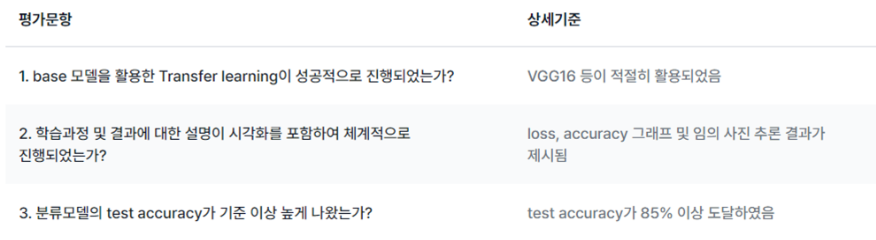![Untitled](https://prod-files-secure.s3.us-west-2.amazonaws.com/cac5509d-b8fe-4ec0-8b1f-30b50e01b0da/ba634e5c-9920-404c-88bc-4fe1fc7918d6/Untitled.png)

### 모델 학습을 위한 데이터셋(dataset) 준비하기

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import numpy as np
import os
import PIL
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

print("TensorFlow version:", tf.__version__)
print("Datasets version:", tfds.__version__)

TensorFlow version: 2.14.0
Datasets version: 4.9.3


In [3]:
import pathlib

dataset_url = "https://www.tensorflow.org/tutorials/load_data/images"
data_dir = tf.keras.utils.get_file('tf_flowers', origin=dataset_url, untar=True)
data_dir = pathlib.Path(data_dir)

(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name = 'tf_flowers',
    split = ['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    data_dir = data_dir,
    download = True,
    with_info = True,
    as_supervised = True,)

# 데이터셋을 확인
print(raw_train)
print(raw_validation)
print(raw_test)

173910/173910 [==============================] - 0s 1us/step


Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]

Dataset tf_flowers downloaded and prepared to /root/.keras/datasets/tf_flowers/tf_flowers/3.0.1. Subsequent calls will reuse this data.
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


### 데이터 시각화를 통해 확인하고, 모델에 입력할 수 있는 형태로 전처리하기

In [4]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

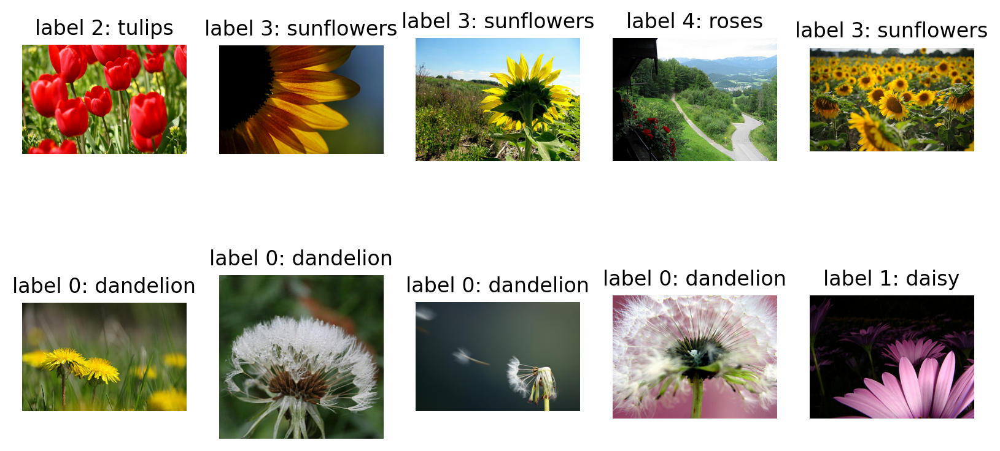

In [5]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [6]:
# 가장 작은 이미지 크기 확인
min_width = float('inf')
min_height = float('inf')

for image, _ in raw_train:
    height, width, _ = image.shape
    min_width = min(min_width, width)
    min_height = min(min_height, height)

print(f"가장 작은 이미지 크기: {min_height} x {min_width}")

가장 작은 이미지 크기: 177 x 145


In [7]:
IMG_SIZE = 224 # 리사이징할 이미지의 크기
# VGG16은 일반적으로 224x224 크기의 이미지를 입력으로 사용

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의 텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<_MapDataset element_spec=(TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


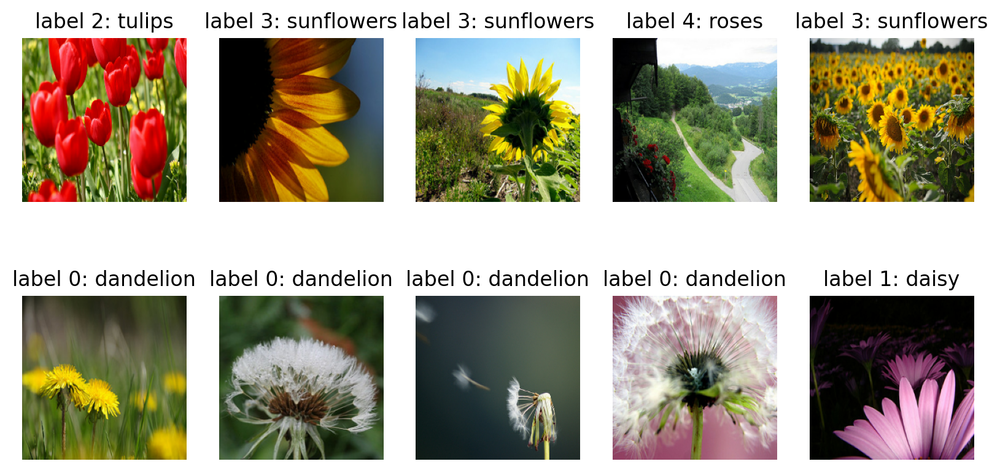

In [8]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

### 텐서플로우를 활용해 모델 구조 설계하기

In [9]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

print("슝~")

슝~


In [10]:
from tensorflow.keras import layers, models

num_classes = metadata.features['label'].num_classes

# 모델 생성
model = models.Sequential()

# 첫 번째 Convolutional Layer
model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(layers.MaxPooling2D((2, 2)))

# 두 번째 Convolutional Layer
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

# 세 번째 Convolutional Layer
model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

# Flatten Layer
model.add(layers.Flatten())

# Fully Connected Layer
model.add(layers.Dense(256, activation='relu'))

# Output Layer
model.add(layers.Dense(num_classes, activation='softmax'))  # num_classes는 클래스의 개수에 맞게 설정

# 학습률 설정
learning_rate = 0.0001
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

# 모델 컴파일
model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# 모델 구조 확인
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 64)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 128)     73856     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 128)       0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 256)       295168    
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 256)       0

### 모델 compile 완료 후 학습시키기

In [11]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 224, 224, 3]), TensorShape([32]))

In [12]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/20 [=================>............] - ETA: 0s - loss: 1.6292 - accuracy: 0.2071

20/20 [==============================] - 9s 52ms/step - loss: 1.6292 - accuracy: 0.2071
initial loss: 1.63
initial accuracy: 0.21


321

In [13]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 17s 128ms/step - loss: 1.2488 - accuracy: 0.4819 - val_loss: 1.0998 - val_accuracy: 0.5368
Epoch 2/10
92/92 [==============================] - 12s 115ms/step - loss: 0.9514 - accuracy: 0.6240 - val_loss: 0.9696 - val_accuracy: 0.6158
Epoch 3/10
92/92 [==============================] - 11s 114ms/step - loss: 0.7820 - accuracy: 0.7088 - val_loss: 0.9820 - val_accuracy: 0.6240
Epoch 4/10
92/92 [==============================] - 11s 115ms/step - loss: 0.6284 - accuracy: 0.7752 - val_loss: 0.9353 - val_accuracy: 0.6294
Epoch 5/10
92/92 [==============================] - 11s 115ms/step - loss: 0.4296 - accuracy: 0.8535 - val_loss: 0.9834 - val_accuracy: 0.6540
Epoch 6/10
92/92 [==============================] - 11s 116ms/step - loss: 0.2981 - accuracy: 0.9097 - val_loss: 0.9904 - val_accuracy: 0.6540
Epoch 7/10
92/92 [==============================] - 11s 116ms/step - loss: 0.1726 - accuracy: 0.9578 - val_loss: 1.1421 - val_accuracy: 0.6240

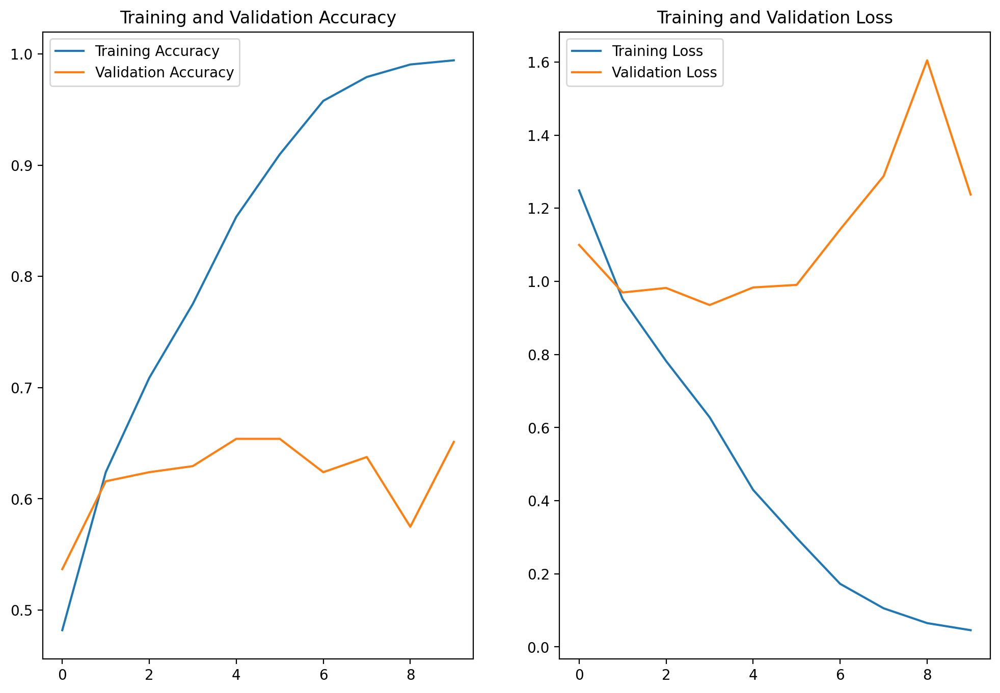

In [14]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [15]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions = np.argmax(predictions, axis=1)
predictions

1/1 [==============================] - 0s 188ms/step


array([2, 0, 0, 2, 0, 0, 2, 4, 3, 0, 0, 4, 3, 4, 0, 3, 2, 0, 0, 4, 2, 0,
       2, 0, 1, 0, 4, 4, 2, 1, 0, 0])

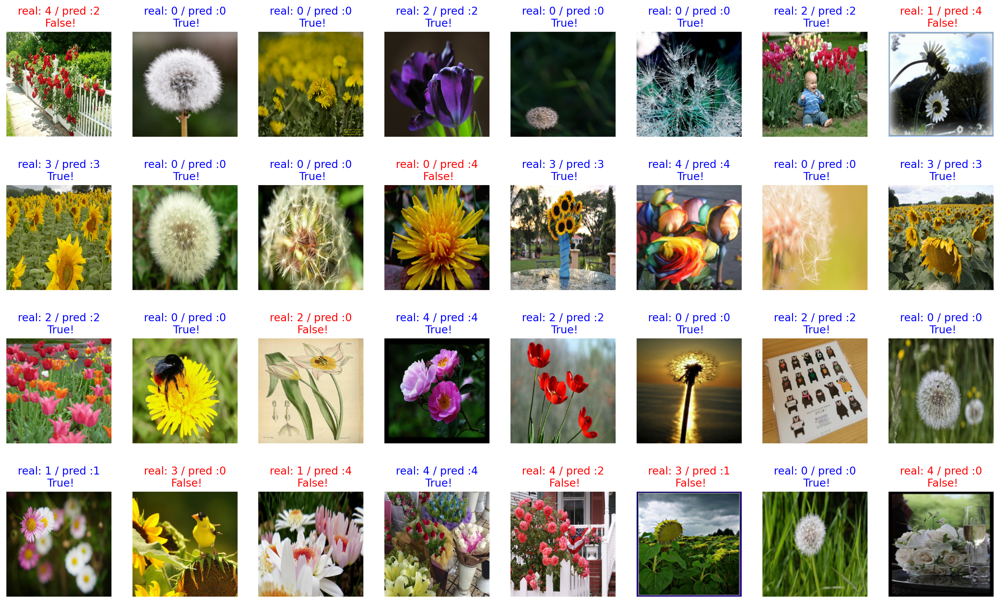

In [16]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [17]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)

71.875


### 사전 학습 모델인 VGG16을 가져오고, 모델의 구조 확인하기

In [18]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

feature_batch = base_model(image_batch)
feature_batch.shape

58889256/58889256 [==============================] - 0s 0us/step


TensorShape([32, 7, 7, 512])

In [19]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [20]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [21]:
dense_layer = Dense(units=512, activation='relu')
prediction_layer = Dense(units=num_classes, activation='softmax')

prediction_batch = prediction_layer(dense_layer(feature_batch_average))

print(prediction_batch.shape)

(32, 5)


In [22]:
base_model.trainable = False

In [23]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (  (None, 512)               0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense_2 (Dense)             (None, 512)               262656    
                                                                 
 dense_3 (Dense)             (None, 5)                 2565      
                                                                 
Total params: 14979909 (57.14 MB)
Trainable params: 265221 (1.01 MB)
Non-trainable params: 14714688 (56.13 MB)
_________________________________________________________________


In [24]:
from tensorflow.keras import optimizers

learning_rate= 0.0001

model.compile(optimizer= optimizers.RMSprop(learning_rate= learning_rate),
              loss= 'sparse_categorical_crossentropy',
              metrics= ['accuracy'])

In [25]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/20 [=================>............] - ETA: 2s - loss: 1.7358 - accuracy: 0.1907

20/20 [==============================] - 9s 209ms/step - loss: 1.7358 - accuracy: 0.1907
initial loss: 1.74
initial accuracy: 0.19


In [26]:
EPOCHS= 10
history= model.fit(train_batches, epochs=EPOCHS, validation_data= validation_batches)

Epoch 1/10
92/92 [==============================] - 21s 208ms/step - loss: 1.3918 - accuracy: 0.5126 - val_loss: 1.1700 - val_accuracy: 0.6403
Epoch 2/10
92/92 [==============================] - 16s 152ms/step - loss: 1.0689 - accuracy: 0.6952 - val_loss: 0.9398 - val_accuracy: 0.7384
Epoch 3/10
92/92 [==============================] - 15s 159ms/step - loss: 0.8869 - accuracy: 0.7388 - val_loss: 0.7983 - val_accuracy: 0.7548
Epoch 4/10
92/92 [==============================] - 14s 147ms/step - loss: 0.7762 - accuracy: 0.7575 - val_loss: 0.7191 - val_accuracy: 0.7657
Epoch 5/10
92/92 [==============================] - 15s 152ms/step - loss: 0.7064 - accuracy: 0.7755 - val_loss: 0.6630 - val_accuracy: 0.7820
Epoch 6/10
92/92 [==============================] - 16s 163ms/step - loss: 0.6554 - accuracy: 0.7902 - val_loss: 0.6292 - val_accuracy: 0.7902
Epoch 7/10
92/92 [==============================] - 16s 161ms/step - loss: 0.6156 - accuracy: 0.8042 - val_loss: 0.5968 - val_accuracy: 0.7956

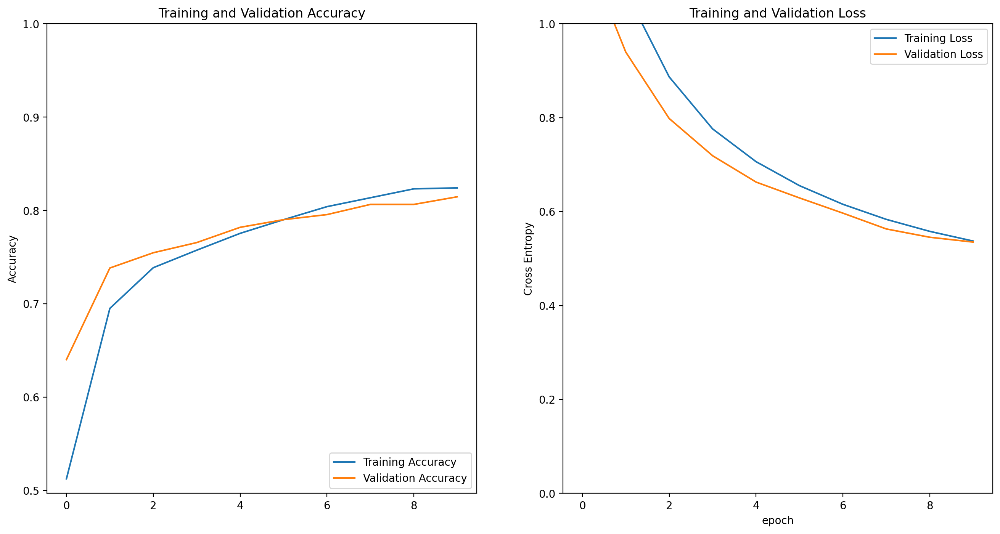

In [27]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [28]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions = np.argmax(predictions, axis=1)
predictions

1/1 [==============================] - 0s 150ms/step


array([2, 0, 0, 2, 0, 0, 2, 1, 3, 0, 0, 1, 3, 4, 0, 3, 2, 0, 2, 4, 2, 0,
       1, 0, 1, 3, 2, 4, 4, 3, 0, 4])

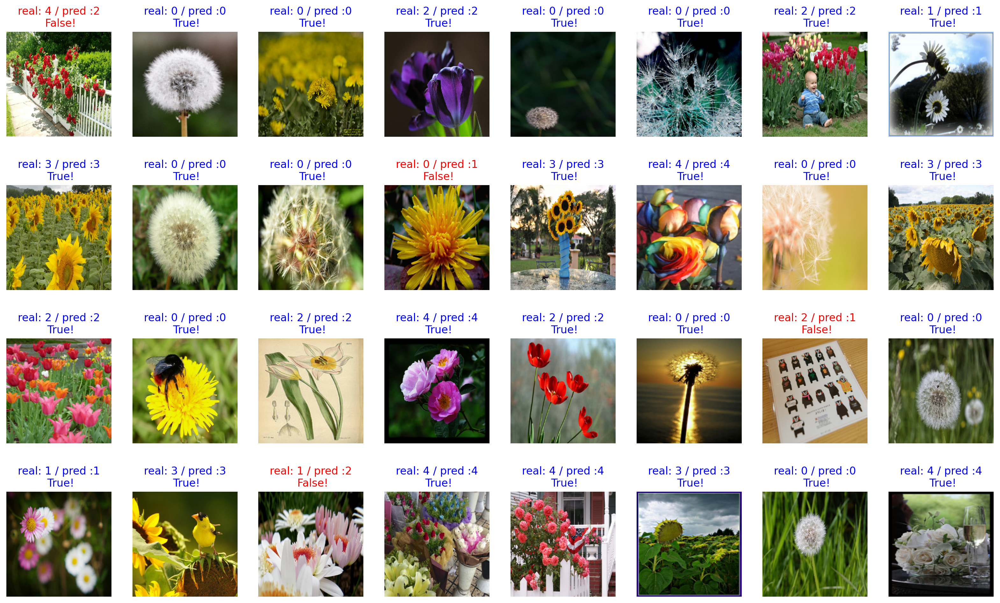

In [29]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [30]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

87.5
